In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# from scipy.stats import gaussian_kde
# from tqdm import tqdm

# 绘制logg-FeH

## SpecTE

In [3]:
# SpecTE星表
catalog_path = r"../2_catalog_SpecTE-LAMOST/catalog.csv"
catalog=pd.read_csv(catalog_path)
catalog

,obsid,ra,dec,snrg,Teff[K],Teff[K]_uncertainty,Logg,Logg_uncertainty,RV,RV_uncertainty,...,OH,OH_uncertainty,AlH,AlH_uncertainty,MnH,MnH_uncertainty,NaH,NaH_uncertainty,VH,VH_uncertainty
0,101001,332.202274,-2.056767,12.22,5149.019186,107.856341,4.490755,0.100001,-32.980172,10.198809,...,-0.313108,0.174559,-0.338310,0.150219,-0.705042,0.181825,-0.675052,0.686339,-0.736398,0.478321
1,101009,332.206665,-1.868653,12.63,5720.460288,135.123599,4.058886,0.285110,-18.054290,9.190242,...,-0.142451,0.188533,-0.089937,0.142646,-0.379029,0.188097,-0.500810,0.598798,-0.420831,0.405779
2,101048,331.854516,-1.617455,12.08,5787.795613,125.883540,3.851010,0.400518,-126.662359,16.639725,...,-0.478860,0.259811,-0.580809,0.309770,-0.938254,0.298207,-0.892373,0.681761,-0.830071,0.529764
3,101060,331.698572,-1.353523,10.59,6180.429133,205.621083,4.025663,0.310743,15.411011,24.359543,...,-0.149246,0.212613,-0.235427,0.226468,-0.321669,0.270013,-0.539388,0.599174,-0.383766,0.378262
4,101080,332.015808,-1.712806,10.25,5117.285699,92.109695,4.528147,0.043553,1.461230,8.547154,...,-0.263853,0.143359,-0.249869,0.130820,-0.644178,0.143633,-0.602995,0.620940,-0.616111,0.412343
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9798533,1128114211,282.281051,35.596414,88.33,5639.430060,249.313311,3.659009,0.609454,-70.274478,15.823246,...,-0.210014,0.171339,-0.283253,0.210576,-0.463401,0.191209,-0.453880,0.489704,-0.415799,0.391494
9798534,1128114221,282.148819,35.679397,82.59,5516.419237,53.893873,4.033165,0.100807,-42.875917,4.208688,...,0.333477,0.048421,0.509637,0.052375,0.404647,0.043522,0.530261,0.132195,0.254474,0.174817
9798535,1128115048,284.570736,36.215758,99.77,5333.518538,39.817300,4.498938,0.028033,27.887928,2.359445,...,0.094646,0.067467,0.116840,0.040170,0.036915,0.037725,-0.019604,0.259248,-0.036422,0.149768
9798536,1128115182,284.218554,35.774518,97.53,6225.834024,78.509956,4.190070,0.111882,-22.763226,3.782047,...,-0.085556,0.096361,-0.167170,0.061403,-0.310340,0.100052,-0.638200,0.548196,-0.308657,0.238707


In [4]:
SpecTE_catalog = catalog.sample(frac=1)       # 打乱顺序
SpecTE_catalog

,obsid,ra,dec,snrg,Teff[K],Teff[K]_uncertainty,Logg,Logg_uncertainty,RV,RV_uncertainty,...,OH,OH_uncertainty,AlH,AlH_uncertainty,MnH,MnH_uncertainty,NaH,NaH_uncertainty,VH,VH_uncertainty
4550457,709414148,170.702650,4.852440,28.53,4759.630214,360.673901,4.289349,0.945250,13.453041,29.307213,...,-0.010651,0.210113,0.110212,0.298589,-0.011526,0.311916,0.008034,0.423599,-0.102596,0.383583
3382127,713601065,94.620709,23.823149,23.75,6224.558915,150.854913,3.824427,0.305867,8.755213,6.064169,...,-0.042860,0.197446,-0.118405,0.147669,-0.179607,0.155701,-0.460171,0.636796,-0.266005,0.423977
74682,526904006,145.861740,18.932297,10.91,4204.534636,298.140322,2.613186,0.991682,-17.963030,44.004449,...,-0.212041,0.233607,-0.236798,0.276571,-0.380968,0.275781,-0.331437,0.323342,-0.394718,0.265987
852980,975709211,97.205485,19.226334,148.62,6511.502818,111.447583,4.190620,0.125260,10.359432,4.970687,...,0.074425,0.111402,-0.087463,0.095698,0.013342,0.125064,-0.446705,0.598269,-0.104634,0.276162
7263272,642007066,129.717390,38.520086,6.83,4173.708083,257.165145,2.253098,0.954551,-28.091000,41.342290,...,-0.262446,0.270694,-0.334023,0.336670,-0.437318,0.367478,-0.434791,0.379159,-0.469124,0.335023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1394727,38907218,178.607593,26.534437,15.93,5738.255425,85.971356,4.073791,0.123423,-13.656284,7.013976,...,0.307457,0.086101,0.464895,0.077523,0.376561,0.068971,0.386926,0.228741,0.224453,0.187796
4617422,100913112,58.169772,25.127823,30.95,5401.213949,60.154423,3.901837,0.125484,34.901469,5.275881,...,0.362419,0.073539,0.491119,0.090271,0.428677,0.057875,0.581950,0.140480,0.328931,0.243421
3151177,855116016,40.375071,46.182140,18.85,4802.816457,200.485281,4.418276,0.288568,-7.498241,16.701901,...,-0.115837,0.159021,-0.116589,0.187396,-0.124905,0.184852,-0.239114,0.479892,-0.127543,0.322650
5021044,947616223,145.431350,24.165743,33.79,4882.703629,47.370630,3.182712,0.154327,99.698622,6.378994,...,-0.111293,0.077285,-0.190806,0.063640,-0.567019,0.067093,-0.477870,0.338774,-0.365073,0.257833


In [5]:
MIST_data = pd.read_csv('./MIST_iso_7Gyr.csv')
MIST_data

,teff_0,logg_0,teff_0.5,logg_0.5,teff_-0.5,logg_-0.5
0,3.501075,5.089305,3.345708,5.094855,3.501113,5.290861
1,3.504288,5.073885,3.348878,5.089544,3.502342,5.286650
2,3.507470,5.058472,3.353420,5.081935,3.505737,5.275018
3,3.510114,5.045869,3.358358,5.073662,3.509132,5.263392
4,3.511546,5.040053,3.363038,5.065822,3.512817,5.250773
...,...,...,...,...,...,...
1470,NaN,NaN,4.394227,7.826435,4.401158,7.823896
1471,NaN,NaN,4.371640,7.834655,4.394430,7.826413
1472,NaN,NaN,4.349421,7.842316,4.387694,7.828894
1473,NaN,NaN,NaN,NaN,4.380951,7.831337


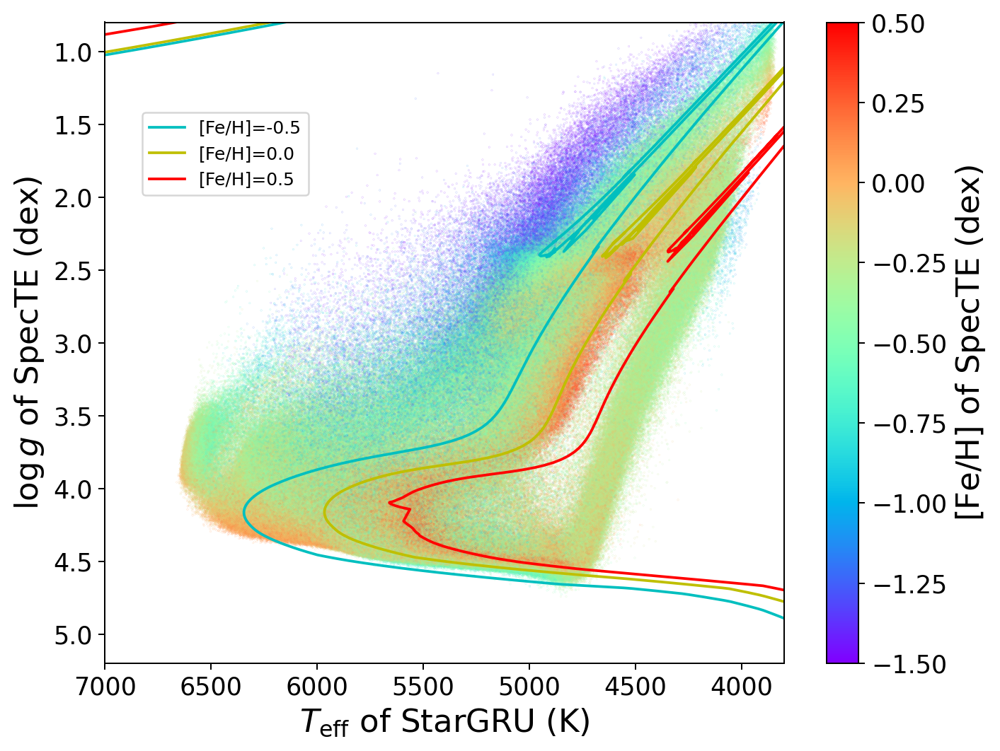

In [6]:
fig = plt.figure(figsize=(8,6),dpi=180)
show_interval = 5

teff = SpecTE_catalog['Teff[K]'].values[::show_interval]
logg = SpecTE_catalog['Logg'].values[::show_interval]
feh = SpecTE_catalog['FeH'].values[::show_interval]

feh[feh > 0.5] = 0.5
feh[feh < -1.5] = -1.5

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.scatter(teff, 
            logg, 
            c=feh, s=0.003, cmap="rainbow")
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14) 
cb.set_label('$\mathrm{[Fe/H]}$ of SpecTE (dex)', fontsize=18)
plt.ylim([5.2,0.8])
plt.xlim([7000,3800])
# plt.clim([-1,0.5])
plt.xlabel('$T_{\mathrm{eff}}$ of SpecTE (K)', fontsize=18)
plt.ylabel('$\log g$ of SpecTE (dex)', fontsize=18)
plt.grid(False) 

plt.plot(10 ** MIST_data['teff_-0.5'], MIST_data['logg_-0.5'], label='[Fe/H]=-0.5', c='c')
plt.plot(10 ** MIST_data['teff_0'], MIST_data['logg_0'], label='[Fe/H]=0.0', c='y')
plt.plot(10 ** MIST_data['teff_0.5'], MIST_data['logg_0.5'], label='[Fe/H]=0.5', c='r')
# plt.legend(loc='center left')
plt.legend(loc=(0.055,0.73))

plt.tight_layout()
# plt.savefig('../images/RRNet_LAMOST_pred_all.pdf')
plt.savefig('./SpecTE_LAMOST_logg_FeH.png')
plt.show()

C:\Users\ZhaoXR\AppData\Local\Temp\ipykernel_18560\290819269.py:55: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


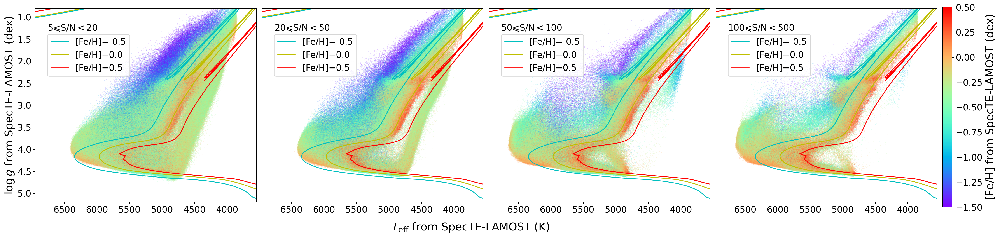

In [6]:
# SpecTE
# snr_region = [[10, 20], [20, 40], [40, 60], [60,100]]
snr_region = [[5, 20], [20, 50], [50, 100], [100,500]]
show_interval = 1

fig, ax = plt.subplots(1, 4, figsize=(6*4,6),dpi=180)
ax = ax.flatten()
fig.subplots_adjust(wspace=0)

for i in range(4):
    index = np.where(SpecTE_catalog['snrg'].apply(lambda x: True if x<snr_region[i][1] and x >=snr_region[i][0] else False))[0]
    

    teff = SpecTE_catalog['Teff[K]'].iloc[index].values[::show_interval]
    logg = SpecTE_catalog['Logg'].iloc[index].values[::show_interval]
    feh = SpecTE_catalog['FeH'].iloc[index].values[::show_interval]

    feh[feh > 0.5] = 0.5
    feh[feh < -1.5] = -1.5
    
    
    plt.figtext(0.0525+(0.24*i), 0.88, "$%d \leqslant \mathrm{S/N} < %d$"%(snr_region[i][0], snr_region[i][1]),fontsize=16)


    ax[i].tick_params(labelsize=16)
    if i == 0:
        a0 = ax[i].scatter(teff, logg, c=feh, s=0.005, cmap="rainbow")
    else:
        ax[i].scatter(teff, logg, c=feh, s=0.005, cmap="rainbow")

    ax[i].set_ylim([5.2,0.8])
    ax[i].set_xlim([6950,3550])
    # plt.clim([-1,0.5])
    # ax[i].set_xlabel('$T_{\mathrm{eff}}$ from SpecTE-LAMOST (K)', fontsize=20)
    if i == 0:
        ax[i].set_ylabel('$\log g$ from SpecTE-LAMOST (dex)', fontsize=20)
    else:
        ax[i].set_yticks([])
        

    ax[i].plot(10 ** MIST_data['teff_-0.5'], MIST_data['logg_-0.5'], label='[Fe/H]=-0.5', c='c')
    ax[i].plot(10 ** MIST_data['teff_0'], MIST_data['logg_0'], label='[Fe/H]=0.0', c='y')
    ax[i].plot(10 ** MIST_data['teff_0.5'], MIST_data['logg_0.5'], label='[Fe/H]=0.5', c='r')
    # plt.legend(loc='center left')
    ax[i].legend(loc=(0.055,0.65), fontsize=16)
    

position=fig.add_axes([0.9995, 0.13, 0.01, 0.85])

cbar = fig.colorbar(a0, ax = ax,cax=position, extend='neither', spacing='proportional', orientation='vertical')
cbar.set_label('$\mathrm{[Fe/H]}$ from SpecTE-LAMOST (dex)', size=20)
cbar.ax.tick_params(labelsize=16)
fig.supxlabel('$T_{\mathrm{eff}}$ from SpecTE-LAMOST (K)', size=20, position=(0.5,0.02,1))

plt.tight_layout()
# plt.savefig('../images/RRNet_LAMOST_pred_snr.pdf', bbox_inches='tight')
plt.savefig('./SpecTE_LAMOST_pred_logg_FeH_snr.png', bbox_inches='tight')
# plt.savefig('./SpecTE_LAMOST_pred_logg_FeH_snr.pdf', bbox_inches='tight')
plt.show()

## StarGRUNet

In [2]:
# StarGRU
catalog = pd.read_csv(r"F:\ZhaoXR\Downloads\StarGRUNet_catalog\StarGRUNet_catalog.csv")
catalog

,Unnamed: 0.1,Unnamed: 0,combined_obsid,combined_snrg,combined_ra,combined_dec,Teff[K],Logg,CH,NH,...,AlH_uncertainty,SiH_uncertainty,SH_uncertainty,KH_uncertainty,CaH_uncertainty,TiH_uncertainty,CrH_uncertainty,MnH_uncertainty,FeH_uncertainty,NiH_uncertainty
0,0,0,600303023,13.52,352.782320,37.664839,6152.567383,4.289980,-0.344540,-0.185311,...,0.243121,0.234910,0.220189,0.217505,0.214111,0.248674,0.303929,0.305325,0.239879,0.252549
1,1,1,821101099,20.67,275.262970,27.882223,6477.995117,4.083116,0.013225,0.134819,...,0.243121,0.234910,0.220189,0.217505,0.214111,0.248674,0.303929,0.305325,0.239879,0.252549
2,2,2,180112010,19.20,85.964237,58.822908,6554.583984,4.157460,-0.121479,0.037496,...,0.243121,0.234910,0.220189,0.217505,0.214111,0.248674,0.303929,0.305325,0.239879,0.252549
3,3,3,183701237,31.11,116.763050,25.239566,5971.125977,4.463379,-0.028094,0.026929,...,0.243121,0.234910,0.220189,0.217505,0.214111,0.248674,0.303929,0.305325,0.239879,0.252549
4,4,4,469009057,36.58,295.229607,29.603617,5128.603027,3.219035,0.132403,0.503588,...,0.243121,0.234910,0.220189,0.217505,0.214111,0.248674,0.303929,0.305325,0.239879,0.252549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8208327,8208327,9993,299602108,6.77,143.344624,37.996905,5429.980469,3.616630,-0.395934,-0.779234,...,0.248311,0.264009,0.216042,0.204096,0.236283,0.249299,0.292239,0.323111,0.253105,0.262615
8208328,8208328,9994,258306234,33.96,321.998791,23.123232,6142.318848,4.439974,-0.196105,-0.195908,...,0.248311,0.264009,0.216042,0.204096,0.236283,0.249299,0.292239,0.323111,0.253105,0.262615
8208329,8208329,9995,57315204,8.56,318.402626,-5.647750,4512.800293,2.207459,-0.342658,-0.328891,...,0.248311,0.264009,0.216042,0.204096,0.236283,0.249299,0.292239,0.323111,0.253105,0.262615
8208330,8208330,9996,267911233,363.19,141.602738,0.389815,6287.317383,4.038559,-0.059306,0.193016,...,0.362963,0.301191,0.230712,0.380670,0.250307,0.286967,0.344580,0.368646,0.312092,0.304882


In [3]:
MIST_data = pd.read_csv('./MIST_iso_7Gyr.csv')
MIST_data

,teff_0,logg_0,teff_0.5,logg_0.5,teff_-0.5,logg_-0.5
0,3.501075,5.089305,3.345708,5.094855,3.501113,5.290861
1,3.504288,5.073885,3.348878,5.089544,3.502342,5.286650
2,3.507470,5.058472,3.353420,5.081935,3.505737,5.275018
3,3.510114,5.045869,3.358358,5.073662,3.509132,5.263392
4,3.511546,5.040053,3.363038,5.065822,3.512817,5.250773
...,...,...,...,...,...,...
1470,NaN,NaN,4.394227,7.826435,4.401158,7.823896
1471,NaN,NaN,4.371640,7.834655,4.394430,7.826413
1472,NaN,NaN,4.349421,7.842316,4.387694,7.828894
1473,NaN,NaN,NaN,NaN,4.380951,7.831337


C:\Users\ZhaoXR\AppData\Local\Temp\ipykernel_18264\3795437309.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


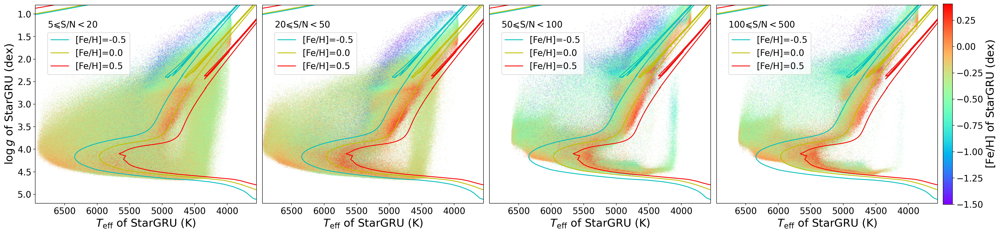

In [5]:
# starGRU
# snr_region = [[10, 20], [20, 40], [40, 60], [60,100]]
snr_region = [[5, 20], [20, 50], [50, 100], [100,500]]
show_interval = 1

fig, ax = plt.subplots(1, 4, figsize=(6*4,6),dpi=180)
ax = ax.flatten()
fig.subplots_adjust(wspace=0)

for i in range(4):
    index = np.where(catalog['combined_snrg'].apply(lambda x: True if x<snr_region[i][1] and x >=snr_region[i][0] else False))[0]
    

    teff = catalog['Teff[K]'].iloc[index].values[::show_interval]
    logg = catalog['Logg'].iloc[index].values[::show_interval]
    feh = catalog['FeH'].iloc[index].values[::show_interval]

    feh[feh > 0.5] = 0.5
    feh[feh < -1.5] = -1.5
    
    
    plt.figtext(0.0525+(0.24*i), 0.88, "$%d \leqslant \mathrm{S/N} < %d$"%(snr_region[i][0], snr_region[i][1]),fontsize=16)


    ax[i].tick_params(labelsize=16)
    if i == 0:
        a0 = ax[i].scatter(teff, logg, c=feh, s=0.005, cmap="rainbow")
    else:
        ax[i].scatter(teff, logg, c=feh, s=0.005, cmap="rainbow")

    ax[i].set_ylim([5.2,0.8])
    ax[i].set_xlim([6950,3550])
    # plt.clim([-1,0.5])
    ax[i].set_xlabel('$T_{\mathrm{eff}}$ of StarGRU (K)', fontsize=20)
    if i == 0:
        ax[i].set_ylabel('$\log g$ of StarGRU (dex)', fontsize=20)
    else:
        ax[i].set_yticks([])
        

    ax[i].plot(10 ** MIST_data['teff_-0.5'], MIST_data['logg_-0.5'], label='[Fe/H]=-0.5', c='c')
    ax[i].plot(10 ** MIST_data['teff_0'], MIST_data['logg_0'], label='[Fe/H]=0.0', c='y')
    ax[i].plot(10 ** MIST_data['teff_0.5'], MIST_data['logg_0.5'], label='[Fe/H]=0.5', c='r')
    # plt.legend(loc='center left')
    ax[i].legend(loc=(0.055,0.65), fontsize=16)

    
position=fig.add_axes([0.9995, 0.13, 0.01, 0.85])

cbar = fig.colorbar(a0, ax = ax,cax=position, extend='neither', spacing='proportional', orientation='vertical')
cbar.set_label('$\mathrm{[Fe/H]}$ of StarGRU (dex)', size=20)
cbar.ax.tick_params(labelsize=16)

plt.tight_layout()
# plt.savefig('../images/RRNet_LAMOST_pred_snr.pdf', bbox_inches='tight')
plt.savefig('./StarGRU_LAMOST_pred_logg_FeH_snr.png', bbox_inches='tight')
plt.show()